# Checking how audio looks like

In [1]:
import tensorflow as tf
import numpy as np
import os
import shutil
import librosa
import IPython
import IPython.display as ipd 
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tqdm import tqdm_notebook
from sklearn.model_selection import StratifiedKFold
%matplotlib inline
matplotlib.style.use('ggplot')

In [98]:
import scipy
from keras import losses, models, optimizers
from keras.optimizers import Adam
from keras.models import Sequential
from keras.activations import relu, softmax
from keras.utils import Sequence, to_categorical
from keras.layers import (Conv1D, Dense, Dropout, GlobalAveragePooling1D, BatchNormalization, Reshape, 
                          LSTM, SimpleRNNCell,
                          GlobalMaxPool1D, Input, MaxPool1D, concatenate, Flatten, LeakyReLU, ReLU)
from keras.callbacks import (EarlyStopping, LearningRateScheduler,
                             ModelCheckpoint, TensorBoard, ReduceLROnPlateau)

In [3]:
USE_GPU = True

if USE_GPU:
    device = '/device:GPU:0'
else:
    device = '/cpu:0'
    
print('Using device: ', device)

Using device:  /device:GPU:0


In [11]:
# CONSTS
DURATION = 4
RATIO = 4
SAMPLE_RATE = int(44100/RATIO)
SHAPE = SAMPLE_RATE*DURATION
NOISE_DIM = 500
MFCC = 40
TRAIN_DATA_PATH = "../../Datasets/freesound-audio-tagging/audio_train/"

In [20]:
def load_train_data(input_length=SHAPE, label = "Saxophone"):
    train = pd.read_csv("../../Datasets/freesound-audio-tagging/train.csv")
    if label != None:
        train_list = train.loc[train.label == label]
    cur_batch_size = len(train_list)
    train_fname_list = train_list.fname
    X = np.empty((cur_batch_size, input_length))
    for i, train_fname in enumerate(train_fname_list):
        file_path = TRAIN_DATA_PATH + train_fname
        
        # Read and Resample the audio
        data, _ = librosa.core.load(file_path, sr=SAMPLE_RATE, res_type='kaiser_fast')

        # Random offset / Padding
        if len(data) > input_length:
            max_offset = len(data) - input_length
            offset = np.random.randint(max_offset)
            data = data[offset:(input_length+offset)]
        else:
            if input_length > len(data):
                max_offset = input_length - len(data)
                offset = np.random.randint(max_offset)
            else:
                offset = 0
            data = np.pad(data, (offset, input_length - len(data) - offset), "constant")
        X[i,] = data
    print("Data Loaded...")
    return X
    
def normalization(X_train):
    mean = X_train.mean(keepdims=True)
    print("Mean: ", mean)
    std  = X_train.std(keepdims=True)
    print("Std: ", std)
    X_train = (X_train - mean) / std
    print("Data Normalized...")
    return X_train

X = load_train_data(input_length=SHAPE, label = "Saxophone")
X = normalization(X)

Data Loaded...
Mean:  [[0.00015859]]
Std:  [[0.19877096]]
Data Normalized...


In [6]:
train = pd.read_csv("../../Datasets/freesound-audio-tagging/train.csv")
x = train.loc[train.label == "Saxophone"]
x = x.fname.head(5)

for i in x:
    print(i)
    fname = "../../Datasets/freesound-audio-tagging/audio_train/" + i
    IPython.display.display(ipd.Audio(filename=fname))

001ca53d.wav


05b76c07.wav


05e4028a.wav


06789937.wav


06f60188.wav


In [7]:
print("Number of training examples=", train.shape[0], "  Number of classes=", len(train.label.unique()))

Number of training examples= 9473   Number of classes= 41


In [8]:
print(train.label.unique())

['Hi-hat' 'Saxophone' 'Trumpet' 'Glockenspiel' 'Cello' 'Knock'
 'Gunshot_or_gunfire' 'Clarinet' 'Computer_keyboard' 'Keys_jangling'
 'Snare_drum' 'Writing' 'Laughter' 'Tearing' 'Fart' 'Oboe' 'Flute' 'Cough'
 'Telephone' 'Bark' 'Chime' 'Bass_drum' 'Bus' 'Squeak' 'Scissors'
 'Harmonica' 'Gong' 'Microwave_oven' 'Burping_or_eructation' 'Double_bass'
 'Shatter' 'Fireworks' 'Tambourine' 'Cowbell' 'Electric_piano' 'Meow'
 'Drawer_open_or_close' 'Applause' 'Acoustic_guitar' 'Violin_or_fiddle'
 'Finger_snapping']


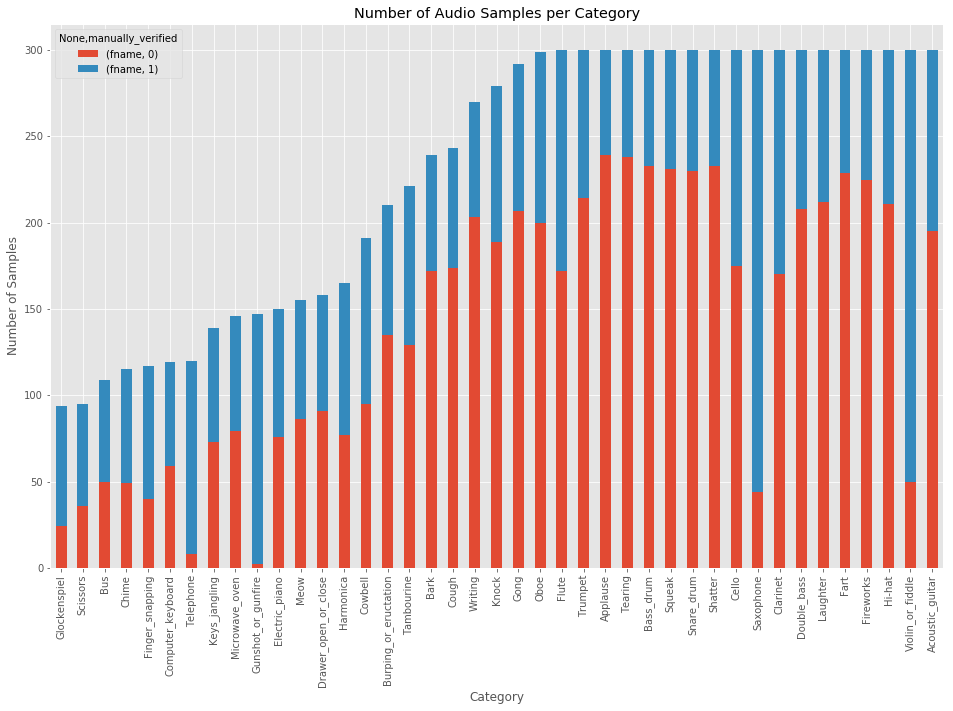

In [9]:
category_group = train.groupby(['label', 'manually_verified']).count()
plot = category_group.unstack().reindex(category_group.unstack().sum(axis=1).sort_values().index)\
          .plot(kind='bar', stacked=True, title="Number of Audio Samples per Category", figsize=(16,10))
plot.set_xlabel("Category")
plot.set_ylabel("Number of Samples");

In [10]:
print('Minimum samples per category = ', min(train.label.value_counts()))
print('Maximum samples per category = ', max(train.label.value_counts()))

Minimum samples per category =  94
Maximum samples per category =  300


Total samples (frames) =  (57771,)
[-1.1887402e-04 -9.1094553e-04 -1.5936997e-03 ... -2.9510313e-05
 -2.0892949e-06 -1.6033226e-05]
<class 'numpy.ndarray'>


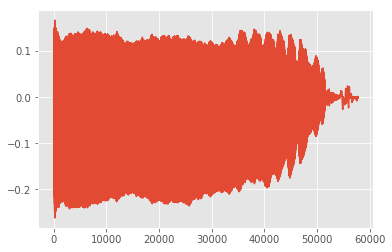

In [12]:
data, _ = librosa.core.load(fname, sr=SAMPLE_RATE, res_type='kaiser_fast')
print("Total samples (frames) = ", data.shape)
print(data)
print(type(data))
plt.plot(data, '-', )
plt.show()

Shape:  (40, 44)


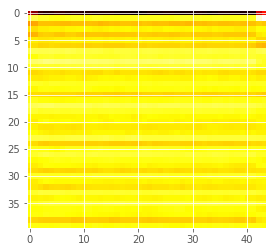

In [13]:
data = data[:2*SAMPLE_RATE]
mfcc = librosa.feature.mfcc(data, sr = SAMPLE_RATE, n_mfcc=40)
print("Shape: ", mfcc.shape)
plt.imshow(mfcc, cmap='hot', interpolation='nearest');

# Using GANs for new sounds

In [14]:
# Discriminator
def discriminator():
    model = Sequential()
    model.add(Dense(1024, input_shape=(SHAPE,)))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2)) 
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(256))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(1, activation='tanh'))
    return model

d = discriminator()
d.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 1024)              45159424  
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 1024)              0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 1024)              4096      
_________________________________________________________________
dense_2 (Dense)              (None, 512)               524800    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 512)               2048      
_________________________________________________________________
dense_3 (Dense)              (None, 256)               131328    
__________

In [104]:
# Generator
def generator():
    model = Sequential()
    model.add(Dense(1024, input_shape=(NOISE_DIM,)))
    model.add(LeakyReLU(alpha=0.01))
    model.add(BatchNormalization(momentum=0.3))
    model.add(Reshape((1024,1)))
    
    model.add(Conv1D(16,301, padding="valid"))
    model.add(ReLU())
    model.add(Conv1D(16,301, padding="valid"))
    model.add(ReLU())
    MaxPool1D(pool_size=16, padding='valid')
    Dropout(rate=0.1)
        
    model.add(Conv1D(8,151, padding="valid"))
    model.add(ReLU())
    model.add(Conv1D(8,151, padding="valid"))
    model.add(ReLU())
    MaxPool1D(pool_size=16, padding='valid')
    Dropout(rate=0.1)
    
    model.add(Conv1D(16,51, padding="valid"))
    model.add(ReLU())
    model.add(Conv1D(16,51, padding="valid"))
    model.add(ReLU())
    MaxPool1D(pool_size=16, padding='valid')
    Dropout(rate=0.1)
    
    model.add(Conv1D(32,7, padding="valid"))
    model.add(ReLU())
    model.add(Conv1D(SHAPE,18, padding="valid", activation='tanh'))
    #model.add(ReLU())
    model.add(Flatten())
    #model.add(Dense(SHAPE, activation='tanh'))   
    return model

g = generator()
g.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_77 (Dense)             (None, 1024)              45159424  
_________________________________________________________________
leaky_re_lu_66 (LeakyReLU)   (None, 1024)              0         
_________________________________________________________________
batch_normalization_66 (Batc (None, 1024)              4096      
_________________________________________________________________
reshape_33 (Reshape)         (None, 1024, 1)           0         
_________________________________________________________________
conv1d_249 (Conv1D)          (None, 724, 16)           4832      
_________________________________________________________________
re_lu_218 (ReLU)             (None, 724, 16)           0         
_________________________________________________________________
conv1d_250 (Conv1D)          (None, 424, 16)           77072     
__________

In [ ]:
def autoEncoder(X, epochs=100,  batch=32):
    G = generator()  
    G.compile(loss = 'mse', optimizer = Adam(lr = 0.001, decay = 0.5), metrics = ['accuracy'])
    for cnt in range(epochs):
        random_index = np.random.randint(0, len(X) - batch)
        legit_audios = X[random_index : int(random_index + batch)]
        loss = G.train_on_batch( legit_audios, legit_audios)
        if cnt % 10 == 0 : 
            print("Epoch: ",cnt, ", Loss: ", loss)
    return G

NOISE_DIM = SHAPE
X = load_train_data(input_length=SHAPE, label = "Saxophone") 
X = normalization(X)
gen = autoEncoder(X, epochs=100,  batch=32)
print("Original:")
IPython.display.display(ipd.Audio(data=X[0], rate=SAMPLE_RATE))
result = gen.predict(X[0].reshape((1,SHAPE))).flatten()
print("Result:")
IPython.display.display(ipd.Audio(data=result, rate=SAMPLE_RATE))

fig1     = plt.figure(figsize=(1, 2))
Original = fig1.add_subplot(1, 2, 1)
Result   = fig1.add_subplot(1, 2, 2)

Original.set_title('Original')
Result.set_title('Result')
Original.plot(X[0], '-', )
Result.plot(result, '-', )

plt.gcf().set_size_inches(15, 4)
plt.subplots_adjust(wspace=0.5,hspace=0.3)
plt.show()

Data Loaded...
Mean:  [[0.00032132]]
Std:  [[0.19781042]]
Data Normalized...


In [105]:
def stacked_G_D(G, D, optimizer):
    model = Sequential()
    model.add(G)
    model.add(D)
    return model

s = stacked_G_D(g,d, Adam(lr = 0.0002, decay = 8e-6))
s.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_61 (Sequential)   (None, 44100)             70743364  
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 45822977  
Total params: 116,566,341
Trainable params: 70,741,316
Non-trainable params: 45,825,025
_________________________________________________________________


In [60]:
def D_lsgan_loss(score_real, score_fake):
    loss = tf.reduce_mean(tf.square(score_real - 1)) / 2 + tf.reduce_mean(tf.square(score_fake)) / 2
    return loss

In [61]:
def G_lsgan_loss(score_real, score_fake):
    loss = tf.reduce_mean(tf.square(score_fake - 1)) / 2
    return loss

In [81]:
class AudioGAN:
    def __init__(self, label = "Saxophone"):
        self.OPTIMIZER = Adam(lr = 0.0002, decay = 8e-6)
        noise_gen = np.random.normal(0,1,(NOISE_DIM,))
        # Generate Models
        self.G = generator()
        self.D = discriminator()
        self.stacked_G_D = stacked_G_D(self.G, self.D, self.OPTIMIZER)
        # Compile Models
        self.D.compile(loss = 'binary_crossentropy', optimizer = self.OPTIMIZER, metrics = ['accuracy'])
        self.stacked_G_D.compile(loss = 'binary_crossentropy', optimizer = self.OPTIMIZER,  metrics = ['accuracy'])
        self.X_train = normalization(load_train_data(SHAPE, label))
        self.D_loss_hist = []
        self.G_loss_hist = []
        
    def train(self, epochs = 20, batch = 32, save_interval = 2):
        for cnt in range(epochs):
            # train discriminator
            halfBatch = int(batch/2)
            random_index = np.random.randint(0, len(self.X_train) - halfBatch)
            legit_audios = self.X_train[random_index : int(random_index + halfBatch)]
            gen_noise = np.random.normal(0, 1, (halfBatch,NOISE_DIM))
            syntetic_audios = self.G.predict(gen_noise)
            x_combined_batch = np.concatenate((legit_audios, syntetic_audios))
            y_combined_batch = np.concatenate((np.ones((halfBatch, 1)), np.zeros((halfBatch, 1))))
            gen.trainable = False
            d_loss = self.D.train_on_batch(x_combined_batch, y_combined_batch)
            gen.trainable = True
            d_loss_mean = np.mean(d_loss)
            self.D_loss_hist.append(d_loss_mean)
            # train generator
            noise = np.random.normal(0, 1, (batch,NOISE_DIM))
            y_mislabled = np.ones((batch, 1))
            disc.trainable = False
            g_loss = self.stacked_G_D.train_on_batch(noise, y_mislabled)
            disc.trainable = True
            g_loss_mean = np.mean(g_loss)
            self.G_loss_hist.append(g_loss_mean)
            print ("epoch: %d" % (cnt)) 
            print ("Discriminator_loss: %f, Generator_loss: %f" % (d_loss_mean, g_loss_mean))
            if cnt % save_interval == 0 : 
                show_audios(G = self.G, step = cnt)

In [82]:
def show_audios(G, samples = 4, step=0):
    noise = np.random.normal(0, 1, (samples,NOISE_DIM))
    audios = G.predict(noise)
    for i, audio in enumerate(audios):
        print("Audio Gen %d" % i)
        IPython.display.display(ipd.Audio(data=audio, rate=SAMPLE_RATE))

In [83]:
myGan = AudioGAN(label = "Saxophone")
myGan.train(epochs = 20, batch = 32, save_interval = 2)

Data Loaded...
Mean:  [[0.00014789]]
Std:  [[0.19739393]]
Data Normalized...
epoch: 0
Discriminator_loss: 1.955110, Generator_loss: 5.115952
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 1
Discriminator_loss: 2.981534, Generator_loss: 4.767431
epoch: 2
Discriminator_loss: 1.970380, Generator_loss: 3.841405
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 3
Discriminator_loss: 2.031562, Generator_loss: 4.309517
epoch: 4
Discriminator_loss: 1.727577, Generator_loss: 4.521221
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 5
Discriminator_loss: 2.541958, Generator_loss: 4.071312
epoch: 6
Discriminator_loss: 2.913070, Generator_loss: 4.525435
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 7
Discriminator_loss: 2.159654, Generator_loss: 4.313656
epoch: 8
Discriminator_loss: 2.949521, Generator_loss: 4.047202
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 9
Discriminator_loss: 2.700536, Generator_loss: 4.337935
epoch: 10
Discriminator_loss: 2.234404, Generator_loss: 4.066477
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 11
Discriminator_loss: 2.246206, Generator_loss: 3.846518
epoch: 12
Discriminator_loss: 2.175511, Generator_loss: 4.517398
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 13
Discriminator_loss: 1.821095, Generator_loss: 4.515757
epoch: 14
Discriminator_loss: 1.371824, Generator_loss: 4.533967
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 15
Discriminator_loss: 2.186222, Generator_loss: 4.285133
epoch: 16
Discriminator_loss: 2.405147, Generator_loss: 4.575430
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 17
Discriminator_loss: 1.599565, Generator_loss: 4.524564
epoch: 18
Discriminator_loss: 1.717433, Generator_loss: 4.069936
Audio Gen 0


Audio Gen 1


Audio Gen 2


Audio Gen 3


epoch: 19
Discriminator_loss: 2.061275, Generator_loss: 4.762030


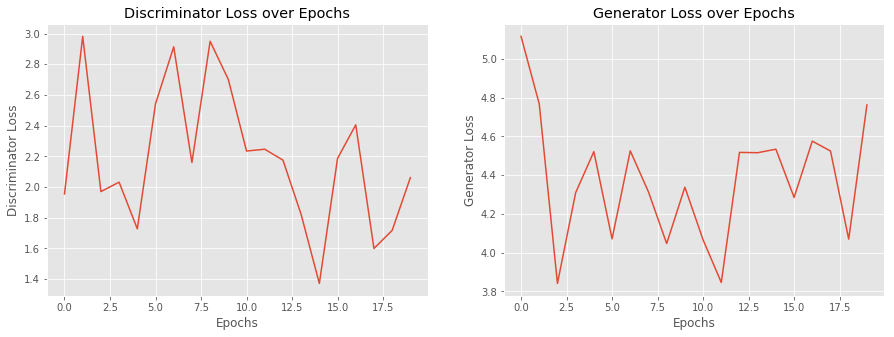

In [107]:
fig     = plt.figure(figsize=(1, 2))
D_loss   = fig.add_subplot(1, 2, 1)
G_loss  = fig.add_subplot(1, 2, 2)

D_loss.set_title('Discriminator Loss over Epochs')
D_loss.set_xlabel('Epochs')
D_loss.set_ylabel('Discriminator Loss')

G_loss.set_title('Generator Loss over Epochs')
G_loss.set_xlabel('Epochs')
G_loss.set_ylabel('Generator Loss')

D_loss.plot(myGan.D_loss_hist, '-', )
G_loss.plot(myGan.G_loss_hist, '-', )

plt.gcf().set_size_inches(15, 5)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

In [108]:
gen_noise = np.random.normal(0, 1, (1,NOISE_DIM))
gen_test = myGan.G.predict(gen_noise).flatten()
IPython.display.display(ipd.Audio(data=gen_test, rate=SAMPLE_RATE))

In [ ]:
plt.plot(gen_test, '-', )
plt.show()